## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import reverse_geocode

from IPython.display import display, clear_output

## Resources
- [Open Academic Graph](https://www.microsoft.com/en-us/research/project/open-academic-graph/)
- [Microsoft Academic Graph](https://www.microsoft.com/en-us/research/project/microsoft-academic-graph/)
    - [Data Scheme](https://learn.microsoft.com/en-us/academic-services/graph/reference-data-schema)
    - [Download](https://zenodo.org/record/6511057#.Y0CCbtLMJki)

## Explore Data

In [2]:
aff_file = 'Affiliations.txt'
auth_file = 'Authors.txt'
paper_auth_aff_file = 'PaperAuthorAffiliations.txt'
paper_file = 'Papers.txt'


aff_cols = ['AffiliationId', 'Rank', 'NormalizedName', 'DisplayName', 'GridId',
            'OfficialPage', 'WikiPage', 'PaperCount','PaperFamilyCount', 
            'CitationCount', 'Iso3166Code', 'Latitude', 'Longitude', 'CreatedDate']

auth_cols = ['AuthorId', 'Rank', 'NormalizedName', 'DisplayName',
             'LastKnownAffiliationId', 'PaperCount', 'PaperFamilyCount', 'CitationCount', 'CreatedDate']

paper_auth_aff_cols = ['PaperId', 'AuthorId' ,'AffiliationId', 
                       'AuthorSequenceNumber', 'OriginalAuthor', 'OriginalAffiliation']

paper_cols = ['PaperId', 'Rank', 'Doi', 'DocType', 'PaperTitle', 
         'OriginalTitle', 'BookTitle', 'Year', 'Date', 
         'OnlineDate', 'Publisher', 'JournalId', 'ConferenceSeriesId', 
         'ConferenceInstanceId', 'Volume', 'Issue', 'FirstPage', 'LastPage', 
         'ReferenceCount', 'CitationCount', 'EstimatedCitation', 'OriginalVenue', 
         'FamilyId', 'FamilyRank', 'DocSubTypes', 'CreatedDate']

## Get one person
- Jimmy Lin for now

In [46]:
author = 'jimmy lin'
chunksize = 10 ** 6
with pd.read_csv(auth_file, chunksize=chunksize, delimiter='\t', names=auth_cols) as reader:
    for chunk in reader:
        req_auth = chunk[chunk['NormalizedName'] == author]
        if len(req_auth) > 0:
            print(req_auth)
            break

            AuthorId   Rank NormalizedName DisplayName  \
20562148  2163619555  13479      jimmy lin   Jimmy Lin   

          LastKnownAffiliationId  PaperCount  PaperFamilyCount  CitationCount  \
20562148             151746483.0         523               479          14777   

         CreatedDate  
20562148  2016-06-24  


- AuthorId 2163619555
- LastKnownAffiliationId 151746483

In [29]:
affiliation_id = 151746483
chunksize = 10 ** 6
with pd.read_csv(aff_file, chunksize=chunksize, delimiter='\t', names=aff_cols) as reader:
    for chunk in reader:
        req_aff = chunk[chunk['AffiliationId'] == affiliation_id]
        if len(req_aff) > 0:
            print(req_aff)

       AffiliationId  Rank          NormalizedName             DisplayName  \
11699      151746483  6968  university of waterloo  University of Waterloo   

              GridId           OfficialPage  \
11699  grid.46078.3d  https://uwaterloo.ca/   

                                                WikiPage  PaperCount  \
11699  http://en.wikipedia.org/wiki/University_of_Wat...       97755   

       PaperFamilyCount  CitationCount Iso3166Code  Latitude  Longitude  \
11699             92279        2445808          CA  43.46889     -80.54   

      CreatedDate  
11699  2016-06-24  


## Get all papers by that author


In [ ]:
author_id = 2163619555
chunksize = 10 ** 6
auth1_papers = pd.DataFrame([], columns=['PaperId', 'AffiliationId'])

with pd.read_csv(paper_auth_aff_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_auth_aff_cols,
                 on_bad_lines='warn') as reader:
    for chunk in reader:
        req_papers = chunk[chunk['AuthorId'] == author_id]
        if len(req_papers) > 0:
#             display(req_papers)
            auth1_papers = pd.concat([auth1_papers, req_papers[['PaperId', 'AffiliationId']]])
            print(len(auth1_papers))

In [63]:
auth1_papers = auth1_papers.rename(columns={"AffiliationId": "AffiliationId_auth1"})

In [64]:
auth1_papers

,PaperId,AffiliationId_auth1
156692,1674447,66946132.0
903782,9861414,66946132.0
1302759,14243949,63966007.0
1529531,16713283,NaN
1569156,17129901,66946132.0
...,...,...
714035683,3188561342,NaN
716276300,3194073685,151746483.0
716326572,3194157311,NaN
718735096,3197834140,151746483.0


In [65]:
auth1_papers['PaperId'].nunique()

519

In [67]:
auth1_papers['AffiliationId_auth1'].nunique()

11

In [68]:
auth1_papers[auth1_papers.duplicated('PaperId', False)]

,PaperId,AffiliationId_auth1
11299012,124454490,6.694613e+07
11299013,124454490,1.299303e+09
176386593,2061172803,6.694613e+07
176386594,2061172803,1.299303e+09
179626782,2065108361,6.694613e+07
179626783,2065108361,1.299303e+09
197690846,2087035354,6.694613e+07
197690847,2087035354,1.299303e+09
683405774,3144366769,6.694613e+07
683405775,3144366769,1.300767e+08


In [69]:
len(auth1_papers)

524

In [70]:
auth1_papers.to_csv('jimmys_papers.csv', index=False)

In [8]:
auth1_papers = pd.read_csv('jimmys_papers.csv')
auth1_papers

,PaperId,AffiliationId_auth1
0,1674447,66946132.0
1,9861414,66946132.0
2,14243949,63966007.0
3,16713283,NaN
4,17129901,66946132.0
...,...,...
519,3188561342,NaN
520,3194073685,151746483.0
521,3194157311,NaN
522,3197834140,151746483.0


## Now get all authors of these papers

In [ ]:
chunksize = 10 ** 6
all_auth_papers = pd.DataFrame([], columns=['PaperId', 'AuthorId', 'AffiliationId', 'AffiliationId_auth1'])

with pd.read_csv(paper_auth_aff_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_auth_aff_cols,
                 on_bad_lines='warn') as reader:
    for chunk in reader:
        req_papers = chunk.join(auth1_papers.set_index('PaperId'), on='PaperId', how='inner')
        if len(req_papers) > 0:
            all_auth_papers = pd.concat([all_auth_papers, req_papers[['PaperId', 'AuthorId', 'AffiliationId', 'AffiliationId_auth1']]])
            print(len(all_auth_papers))

In [77]:
len(all_auth_papers)

2142

In [80]:
len(all_auth_papers[all_auth_papers['AuthorId'] != author_id])

1608

In [81]:
len(all_auth_papers[all_auth_papers['AuthorId'] == author_id])

534

In [95]:
all_auth_papers

,PaperId,AuthorId,AffiliationId,AffiliationId_auth1
156691,1674447,2103777546,6.694613e+07,66946132.0
156692,1674447,2163619555,6.694613e+07,66946132.0
903778,9861414,336997814,7.882870e+06,66946132.0
903779,9861414,2021418772,1.321297e+09,66946132.0
903780,9861414,2078704756,7.882870e+06,66946132.0
...,...,...,...,...
719219395,3198536471,2163619555,1.517465e+08,151746483.0
719219396,3198536471,2166008087,8.735458e+07,151746483.0
719219397,3198536471,2304906377,1.517465e+08,151746483.0
719219398,3198536471,2893664429,2.995553e+07,151746483.0


In [94]:
all_auth_papers.to_csv('all_auths_of_jimmys_papers.csv', index=False)

## Get info (year, citations) of paper

In [ ]:
chunksize = 10 ** 5
all_paper_info = pd.DataFrame([], columns=['PaperId', 'AuthorId', 'AffiliationId', 'CitationCount',
                                           'AffiliationId_auth1', 'Year', 'Date'])

with pd.read_csv(paper_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_cols,
                 on_bad_lines='warn',
                 usecols = ['PaperId', 'Year', 'Date', 'CitationCount']) as reader:
    for chunk in reader:
        req_papers = chunk.join(all_auth_papers.set_index('PaperId'), on='PaperId', how='inner')
        if len(req_papers) > 0:
            all_paper_info = pd.concat([all_paper_info, req_papers])
#             print(len(all_paper_info))

In [31]:
len(all_paper_info) #2140

2140

## Now grab the location and name of the Affiliations

In [34]:
all_aff = pd.read_csv(aff_file, delimiter='\t', names=aff_cols)

In [ ]:
df = all_paper_info.merge(
    all_aff[['AffiliationId', 'Latitude','Longitude', 'DisplayName']].set_index('AffiliationId'),
    on = 'AffiliationId',
    how='inner'
).merge(
    all_aff[['AffiliationId', 'Latitude','Longitude', 'DisplayName']],
    left_on='AffiliationId_auth1',
    right_on='AffiliationId',
    suffixes=("", "_auth_1")
).drop(columns = 'AffiliationId_auth1')

df

In [37]:
df.to_csv('all_jimmys_paper_info.csv', index=False)

In [3]:
df_loaded = pd.read_csv('all_jimmys_paper_info.csv')

## Analysis

In [46]:
paper_per_year_count = \
            df['Year'].value_counts().to_frame().reset_index()\
                      .set_axis(['Year', 'Number of Papers'], axis=1)
paper_per_year_count['Year'] = paper_per_year_count['Year'].astype('int')

In [50]:
paper_per_year_count.sort_values('Year')

,Year,Number of Papers
24,1992,1
22,1999,8
21,2000,10
20,2001,11
18,2002,14
13,2003,42
19,2004,11
15,2005,32
9,2006,54
14,2007,39


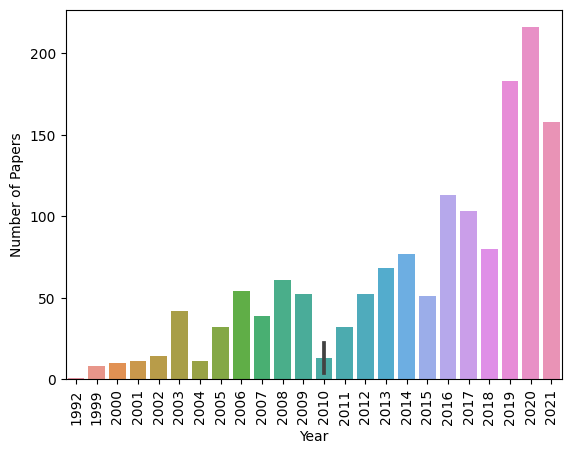

In [47]:
g = sns.barplot(data=paper_per_year_count, x='Year', y='Number of Papers')
g.set_xticklabels(g.get_xticklabels(), rotation=90);

## Geo Plot

In [26]:
df_loaded = pd.read_csv('all_jimmys_paper_info.csv')

In [27]:
df = df_loaded.drop(columns='AuthorId').drop_duplicates().reset_index(drop=True)

In [55]:
fig = go.Figure()

lat_longs_auth_others = df[['Latitude', 'Longitude', 'DisplayName']].drop_duplicates()

lat_longs_auth_1 = df[['Latitude_auth_1', 'Longitude_auth_1', 'DisplayName_auth_1']]\
    .rename(columns={'Latitude_auth_1':'Latitude', 'Longitude_auth_1':'Longitude', 'DisplayName_auth_1':'DisplayName'})\
    .drop_duplicates()

mx_citation = df['CitationCount'].max()
colabs = []
for i in range(len(df)):
    fig.add_trace(
        go.Scattergeo(
#             locationmode = 'USA-states',
            lat = [df['Latitude_auth_1'][i], df['Latitude'][i]],
            lon = [df['Longitude_auth_1'][i], df['Longitude'][i]],
            mode = 'lines',
            line = dict(width = 1,color = 'red'),
            opacity = float(df['CitationCount'][i]) / float(mx_citation),
            hoverinfo = 'text',
            text = "Citations: {}".format(int(df['CitationCount'][i])),
        )
    )
    
## Other Auths
fig.add_trace(go.Scattergeo(
    lon = lat_longs_auth_others['Longitude'],
    lat = lat_longs_auth_others['Latitude'],
    hoverinfo = 'text',
    text = lat_longs_auth_others['DisplayName'],
    mode = 'markers',
    marker = dict(
        size = 6,
        color = 'rgb(57, 153, 77)', ## green
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

## Auth 1
fig.add_trace(go.Scattergeo(
    lon = lat_longs_auth_1['Longitude'],
    lat = lat_longs_auth_1['Latitude'],
    hoverinfo = 'text',
    text = lat_longs_auth_1['DisplayName'],
    mode = 'markers',
    marker = dict(
        size = 6,
        color = 'rgb(255, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

fig.update_layout(
    title_text = "Collaborations over the years by Jimmy Lin<br>"
                "<span style=\"font-size:13px\">Hover for institution names. Red stars indicate Jimmy Lin's associations, "
                "Green dots are colaborator associations.</span>",
    showlegend = False,
    geo = dict(
#         scope = 'north america',
#         projection_type = 'azimuthal equal area',
#         showland = True,
#         landcolor = 'rgb(243, 243, 243)',
#         countrycolor = 'rgb(204, 204, 204)',
        countrycolor = 'rgb(166, 183, 222)',
        showcountries = True,
    ),
    margin=dict(l=20, r=20, t=60, b=20)
)

fig.show()

In [56]:
with open('index.html', 'w') as f:
    f.write(fig.to_html(full_html=False, include_plotlyjs='cdn'))

In [58]:
df['nan'] = None
df['Year'] = df['Year'].astype('int')

In [63]:
### Try animation with GO
frames = []

# create a frame for each grouping
for year, _df in df.groupby('Year'):
    
    auth_1_locs = _df[['Latitude_auth_1', 'Longitude_auth_1', 'DisplayName_auth_1']].drop_duplicates()
    auth_1_locs = auth_1_locs.rename(columns = {col:col.split('_')[0] for col in auth_1_locs.columns})
    
    other_auths_locs = pd.concat([
                            _df[['Latitude', 'Longitude', 'DisplayName']].drop_duplicates(),
                             auth_1_locs,
                             auth_1_locs
                            ]
                           ).drop_duplicates(keep=False)
    
    # plot lines only when the locs are different, else its just a point
    _df = _df[(_df['Latitude']!=_df['Latitude_auth_1']) | (_df['Longitude']!=_df['Longitude_auth_1'])]\
            .drop_duplicates()
    
    frames.append(
        go.Frame(
            name=year,
            data=[
                ## The line
                go.Scattergeo(
                    lat=_df[["Latitude", "Latitude_auth_1", "nan"]].values.ravel(),
                    lon=_df[["Longitude", "Longitude_auth_1", "nan"]].values.ravel(),
                    mode="lines",
                    line=dict(width=1, color='blue'),
                    hoverinfo = 'skip',
                ),
                ## Other Auths
                go.Scattergeo(
                    lon = other_auths_locs['Longitude'],
                    lat = other_auths_locs['Latitude'],
                    hoverinfo = 'text',
                    text = other_auths_locs['DisplayName'],
                    mode = 'markers',
                    marker = dict(
                        size = 8,
                        color = 'rgb(57, 153, 77)', ## green
                        symbol = 'circle',
                    )
                ),
                ## Auth 1
                go.Scattergeo(
                    lon = auth_1_locs['Longitude'],
                    lat = auth_1_locs['Latitude'],
                    hoverinfo = 'text',
                    text = auth_1_locs['DisplayName'],
                    mode = 'markers',
                    marker = dict(
                        size = 8,
                        color = 'rgb(255, 0, 0)', ## red
                        symbol = 'star',
                    )
                ),
            ],
            traces=[0, 1, 2],
        )
    )

# now create figure and add play button and slider
fig = go.Figure(
    data=frames[0].data,
    frames=frames,
    layout={
        "updatemenus": [
            {
                "type": "buttons",
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 500, "redraw": True},"fromcurrent": True, "transition": {"duration": 300, "easing": "quadratic-in-out"}}],
                        "label": "▶",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True},"mode": "immediate", "transition": {"duration": 0}}],
                        "label": "⏸",
                        "method": "animate"
                    }
                ],
            }
        ],
        "sliders": [
            {
                "active": 0,
                "steps": [
                    {
                        "label": f.name,
                        "method": "animate",
                        "args": [[f.name]],
                    }
                    for f in frames
                ],
            }
        ],
    },
)

fig.update_geos(
    visible=False, 
    resolution=50,
    showland=True, landcolor="rgb(245, 245, 245)",
    showcountries=True, countrycolor="rgb(161, 161, 161)",
    showocean=True, oceancolor="rgb(222, 247, 250)",
    showlakes=True, lakecolor="rgb(222, 247, 250)",
)

fig.update_layout(showlegend=False,
                  margin=dict(l=0, r=0, t=100, b=0, pad=0),
                  sliders=[{"pad":dict(t=10, r=10, l=10)}],
                  updatemenus=[dict(type='buttons',
                                  showactive=False,
                                  y= 0,
                                  x= 0,
                                  xanchor='left',
                                  yanchor='bottom')
                              ],
                  title = "Jimmys collaboration over the years<br>"
                          "<span style=\"font-size:13px\">Hover for institution names."
                          "Red stars indicate Jimmy Lin's associations, "
                          "Green dots are colaborator associations.<br>"
                          "Each year shows collaboration links for that year only.</span>",
                 )

fig.write_html('plot.html', auto_play = False)
fig.show(auto_play = False)

In [64]:
with open('index.html', 'a') as f:
    f.write(fig.to_html(auto_play = False, full_html=False, include_plotlyjs=False))

## Individual Cummulative

In [65]:
frames = []

years = df['Year'].astype(int).sort_values().unique()

for year in years:
    
    _df = df[df['Year']<=year]
    auth_1_locs = _df[['Latitude_auth_1', 'Longitude_auth_1', 'DisplayName_auth_1']].drop_duplicates()
    auth_1_locs = auth_1_locs.rename(columns = {col:col.split('_')[0] for col in auth_1_locs.columns})
    
    other_auths_locs = pd.concat([
                            _df[['Latitude', 'Longitude', 'DisplayName']].drop_duplicates(),
                             auth_1_locs,
                             auth_1_locs
                            ]
                           ).drop_duplicates(keep=False)
    
    # plot lines only when the locs are different, else its just a point
    _df = _df[(_df['Latitude']!=_df['Latitude_auth_1']) | (_df['Longitude']!=_df['Longitude_auth_1'])]\
            .drop_duplicates()
    
    frames.append(
        go.Frame(
            name=int(year),
            data=[
                ## The line
                go.Scattergeo(
                    lat=_df[["Latitude", "Latitude_auth_1", "nan"]].values.ravel(),
                    lon=_df[["Longitude", "Longitude_auth_1", "nan"]].values.ravel(),
                    mode="lines",
                    line=dict(width=1, color='blue'),
                    hoverinfo = 'skip',
                ),
                ## Other Auths
                go.Scattergeo(
                    lon = other_auths_locs['Longitude'],
                    lat = other_auths_locs['Latitude'],
                    hoverinfo = 'text',
                    text = other_auths_locs['DisplayName'],
                    mode = 'markers',
                    marker = dict(
                        size = 8,
                        color = 'rgb(57, 153, 77)', ## green
                        symbol = 'circle',
                    )
                ),
                ## Auth 1
                go.Scattergeo(
                    lon = auth_1_locs['Longitude'],
                    lat = auth_1_locs['Latitude'],
                    hoverinfo = 'text',
                    text = auth_1_locs['DisplayName'],
                    mode = 'markers',
                    marker = dict(
                        size = 8,
                        color = 'rgb(255, 0, 0)', ## red
                        symbol = 'star',
                    )
                ),
            ],
            traces=[0, 1, 2],
        )
    )

# now create figure and add play button and slider
fig = go.Figure(
    data=frames[0].data,
    frames=frames,
    layout={
        "updatemenus": [
            {
                "type": "buttons",
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 500, "redraw": True},"fromcurrent": True, "transition": {"duration": 300, "easing": "quadratic-in-out"}}],
                        "label": "▶",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True},"mode": "immediate", "transition": {"duration": 0}}],
                        "label": "⏸",
                        "method": "animate"
                    }
                ],
            }
        ],
        "sliders": [
            {
                "active": 0,
                "steps": [
                    {
                        "label": f.name,
                        "method": "animate",
                        "args": [[f.name]],
                    }
                    for f in frames
                ],
            }
        ],
    },
)

fig.update_geos(
    visible=False, 
    resolution=50,
    showland=True, landcolor="rgb(245, 245, 245)",
    showcountries=True, countrycolor="rgb(161, 161, 161)",
    showocean=True, oceancolor="rgb(222, 247, 250)",
    showlakes=True, lakecolor="rgb(222, 247, 250)",
)

fig.update_layout(showlegend=False,
                  margin=dict(l=0, r=0, t=50, b=0, pad=0),
                  sliders=[{"pad":dict(t=10, r=10, l=10)}],
                  updatemenus=[dict(type='buttons',
                                  showactive=False,
                                  y= 0,
                                  x= 0,
                                  xanchor='left',
                                  yanchor='bottom')
                              ],
                  title = "Jimmys cummulative collaboration over the years<br>"
                          "<span style=\"font-size:13px\">Hover for institution names."
                          "Red stars indicate Jimmy Lin's associations, "
                          "Green dots are colaborator associations.<br><span>",
                 )

fig.write_html('plot_cumm_individual.html', auto_play = False)
fig.show(auto_play = False)

In [66]:
with open('index.html', 'a') as f:
    f.write(fig.to_html(auto_play = False, full_html=False, include_plotlyjs=False))

## Collaborations of UWaterloo with  the world!
UWaterloo Id: 151746483

In [120]:
## making sure UWaterloo doesn't have more than one name/variety/dept wise separate name etc
chunksize = 10 ** 6
with pd.read_csv(aff_file, chunksize=chunksize, delimiter='\t', names=aff_cols) as reader:
    for chunk in reader:
        req_aff = chunk[chunk['NormalizedName'].str.contains("waterloo")]
        if len(req_aff) > 0:
            print(req_aff[['AffiliationId', 'NormalizedName']])

       AffiliationId                     NormalizedName
5841       163192388         waterloo lutheran seminary
11699      151746483             university of waterloo
13103      267957693             waterloo hydrogeologic
13746     2802246343  regional municipality of waterloo


## Get all papers by UWaterloo


In [ ]:
uni_id = 151746483
chunksize = 10 ** 6
uw_papers = pd.DataFrame([], columns=['PaperId'])

with pd.read_csv(paper_auth_aff_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_auth_aff_cols,
                 on_bad_lines='warn') as reader:
    for chunk in reader:
        req_papers = chunk[chunk['AffiliationId'] == uni_id]
        if len(req_papers) > 0:
            uw_papers = pd.concat([uw_papers, req_papers[['PaperId']]])

In [123]:
uw_papers['PaperId'].nunique()

97300

In [125]:
uw_papers = uw_papers.drop_duplicates()
len(uw_papers)

97300

## Now get all other affiliations of these papers

In [129]:
chunksize = 10 ** 6
all_uw_papers = pd.DataFrame([], columns=['PaperId', 'AffiliationId'])

with pd.read_csv(paper_auth_aff_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_auth_aff_cols,
                 usecols = ['PaperId', 'AffiliationId'],
                 on_bad_lines='warn') as reader:
    for chunk in reader:
        req_papers = chunk.join(uw_papers.set_index('PaperId'), on='PaperId', how='inner')
        if len(req_papers) > 0:
            all_uw_papers = pd.concat([all_uw_papers, req_papers])

In [130]:
len(all_uw_papers)

408630

In [131]:
all_uw_papers = all_uw_papers.drop_duplicates()
len(all_uw_papers)

221824

In [146]:
## remove uwaterloo as affiliation
all_uw_papers = all_uw_papers[all_uw_papers['AffiliationId']!=uni_id]

In [147]:
len(all_uw_papers)

124524

## Get info (year, citations) of paper

In [ ]:
chunksize = 10 ** 5
all_paper_info = pd.DataFrame([], columns=['PaperId', 'AffiliationId', 'CitationCount', 'Year'])

with pd.read_csv(paper_file, 
                 chunksize=chunksize, 
                 delimiter='\t', 
                 names=paper_cols,
                 on_bad_lines='warn',
                 usecols = ['PaperId', 'Year', 'CitationCount']) as reader:
    for chunk in reader:
        req_papers = chunk.join(all_uw_papers.set_index('PaperId'), on='PaperId', how='inner')
        if len(req_papers) > 0:
            all_paper_info = pd.concat([all_paper_info, req_papers])

In [151]:
len(all_paper_info)

124227

## Now grab the location and name of the Affiliations

In [152]:
all_aff = pd.read_csv(aff_file, delimiter='\t', names=aff_cols)

In [153]:
df = all_paper_info.merge(
            all_aff[['AffiliationId', 'Latitude','Longitude', 'DisplayName']].set_index('AffiliationId'),
            on = 'AffiliationId',
            how='inner'
        )

In [158]:
len(df), len(df.drop_duplicates())

(108702, 108702)

In [167]:
df.to_csv('uw_papers_long_format.csv', index=False)

In [304]:
df = pd.read_csv('uw_papers_long_format.csv')
df

,PaperId,AffiliationId,CitationCount,Year,Latitude,Longitude,DisplayName
0,1973492155,2.417490e+05,226.0,1995.0,52.205280,0.117220,University of Cambridge
1,3104828006,2.417490e+05,3.0,1995.0,52.205280,0.117220,University of Cambridge
2,3014538554,2.417490e+05,3.0,2020.0,52.205280,0.117220,University of Cambridge
3,2073050616,2.417490e+05,43.0,2010.0,52.205280,0.117220,University of Cambridge
4,1546984121,2.417490e+05,3.0,2008.0,52.205280,0.117220,University of Cambridge
...,...,...,...,...,...,...,...
108697,2097145976,1.322438e+09,17.0,1998.0,44.048110,-123.068184,Oregon Research Institute
108698,2605977107,5.088121e+07,38.0,2017.0,55.866480,12.380180,NIRAS
108699,2005293531,7.349482e+07,13.0,2014.0,40.695280,-74.572890,Applied Communication Sciences
108700,3135393701,4.927826e+07,2.0,2021.0,24.691600,92.751200,Assam University


## Group paper info

In [166]:
grouped_df = \
    df.groupby(['Year', 'AffiliationId', 'Latitude','Longitude', 'DisplayName'])\
        .agg({'CitationCount':['sum', 'mean']})\
        .reset_index()
grouped_df.columns = ['_'.join(col) if len(col[1])>0 else col[0] for col in grouped_df.columns.values]
grouped_df

,Year,AffiliationId,Latitude,Longitude,DisplayName,CitationCount_sum,CitationCount_mean
0,1924.0,6.703139e+07,45.38310,-75.697600,Carleton University,3.0,3.0
1,1960.0,4.624765e+07,49.80944,-97.132780,University of Manitoba,0,0.0
2,1961.0,1.415843e+08,51.75333,-0.243890,University of Hertfordshire,0.0,0.0
3,1962.0,7.441350e+07,42.30667,-83.065830,University of Windsor,2,2.0
4,1962.0,1.852618e+08,43.66167,-79.395000,University of Toronto,2,2.0
...,...,...,...,...,...,...,...
30341,2021,1.976042e+08,38.89705,-77.019240,National Research Council,0,0.0
30342,2021,2.013847e+08,33.70768,73.070470,National University of Computer and Emerging S...,0,0.0
30343,2021,2.026974e+08,47.37472,8.548330,University of Zurich,0,0.0
30344,2021,9.134812e+08,51.96709,5.658603,Wageningen University and Research Centre,0,0.0


## Plot Stuff

In [312]:
country2continent = {'BQ':'South America', 'VA':'Europe', 'AD':'Europe','AE':'Asia','AF':'Asia','AG':'North America','AI':'North America','AL':'Europe','AM':'Asia','AN':'North America','AO':'Africa','AQ':'Antarctica','AR':'South America','AS':'Australia','AT':'Europe','AU':'Australia','AW':'North America','AZ':'Asia','BA':'Europe','BB':'North America','BD':'Asia','BE':'Europe','BF':'Africa','BG':'Europe','BH':'Asia','BI':'Africa','BJ':'Africa','BM':'North America','BN':'Asia','BO':'South America','BR':'South America','BS':'North America','BT':'Asia','BW':'Africa','BY':'Europe','BZ':'North America','CA':'North America','CC':'Asia','CD':'Africa','CF':'Africa','CG':'Africa','CH':'Europe','CI':'Africa','CK':'Australia','CL':'South America','CM':'Africa','CN':'Asia','CO':'South America','CR':'North America','CU':'North America','CV':'Africa','CX':'Asia','CY':'Asia','CZ':'Europe','DE':'Europe','DJ':'Africa','DK':'Europe','DM':'North America','DO':'North America','DZ':'Africa','EC':'South America','EE':'Europe','EG':'Africa','EH':'Africa','ER':'Africa','ES':'Europe','ET':'Africa','FI':'Europe','FJ':'Australia','FK':'South America','FM':'Australia','FO':'Europe','FR':'Europe','GA':'Africa','GB':'Europe','GD':'North America','GE':'Asia','GF':'South America','GG':'Europe','GH':'Africa','GI':'Europe','GL':'North America','GM':'Africa','GN':'Africa','GP':'North America','GQ':'Africa','GR':'Europe','GS':'Antarctica','GT':'North America','GU':'Australia','GW':'Africa','GY':'South America','HK':'Asia','HN':'North America','HR':'Europe','HT':'North America','HU':'Europe','ID':'Asia','IE':'Europe','IL':'Asia','IM':'Europe','IN':'Asia','IO':'Asia','IQ':'Asia','IR':'Asia','IS':'Europe','IT':'Europe','JE':'Europe','JM':'North America','JO':'Asia','JP':'Asia','KE':'Africa','KG':'Asia','KH':'Asia','KI':'Australia','KM':'Africa','KN':'North America','KP':'Asia','KR':'Asia','KW':'Asia','KY':'North America','KZ':'Asia','LA':'Asia','LB':'Asia','LC':'North America','LI':'Europe','LK':'Asia','LR':'Africa','LS':'Africa','LT':'Europe','LU':'Europe','LV':'Europe','LY':'Africa','MA':'Africa','MC':'Europe','MD':'Europe','ME':'Europe','MG':'Africa','MH':'Australia','MK':'Europe','ML':'Africa','MM':'Asia','MN':'Asia','MO':'Asia','MP':'Australia','MQ':'North America','MR':'Africa','MS':'North America','MT':'Europe','MU':'Africa','MV':'Asia','MW':'Africa','MX':'North America','MY':'Asia','MZ':'Africa','NA':'Africa','NC':'Australia','NE':'Africa','NF':'Australia','NG':'Africa','NI':'North America','NL':'Europe','NO':'Europe','NP':'Asia','NR':'Australia','NU':'Australia','NZ':'Australia','OM':'Asia','PA':'North America','PE':'South America','PF':'Australia','PG':'Australia','PH':'Asia','PK':'Asia','PL':'Europe','PM':'North America','PN':'Australia','PR':'North America','PS':'Asia','PT':'Europe','PW':'Australia','PY':'South America','QA':'Asia','RE':'Africa','RO':'Europe','RS':'Europe','RU':'Europe','RW':'Africa','SA':'Asia','SB':'Australia','SC':'Africa','SD':'Africa','SE':'Europe','SG':'Asia','SH':'Africa','SI':'Europe','SJ':'Europe','SK':'Europe','SL':'Africa','SM':'Europe','SN':'Africa','SO':'Africa','SR':'South America','ST':'Africa','SV':'North America','SY':'Asia','SZ':'Africa','TC':'North America','TD':'Africa','TF':'Antarctica','TG':'Africa','TH':'Asia','TJ':'Asia','TK':'Australia','TM':'Asia','TN':'Africa','TO':'Australia','TR':'Asia','TT':'North America','TV':'Australia','TW':'Asia','TZ':'Africa','UA':'Europe','UG':'Africa','US':'North America','UY':'South America','UZ':'Asia','VC':'North America','VE':'South America','VG':'North America','VI':'North America','VN':'Asia','VU':'Australia','WF':'Australia','WS':'Australia','YE':'Asia','YT':'Africa','ZA':'Africa','ZM':'Africa','ZW':'Africa'}

def get_continent(df):
    coords = df[['Latitude', 'Longitude']]
    countries = reverse_geocode.search(coords)
    return [country2continent[v['country_code']] for v in countries]

In [230]:
grouped_df['continent'] = get_continent(grouped_df)

In [234]:
grouped_df['continent'].unique()

array(['North America', 'Europe', 'Australia', 'Asia', 'Africa',
       'South America'], dtype=object)

In [67]:
color_map = {
    'North America' : 'rgb(134, 235, 161)', 
    'Europe' : 'rgb(107, 163, 219)', 
    'Australia' : 'rgb(235, 122, 87)', 
    'Asia' : 'rgb(235, 193, 87)', 
    'Africa' : 'rgb(79, 30, 168)',
    'South America' : 'rgb(176, 49, 138)'
}

In [68]:
grouped_df = pd.read_csv("grouped_df.csv")

In [69]:
frames = []

# UWaterloo Info
uni_Id = 151746483
uni_name = 'University of Waterloo'
uni_lat = 43.46889
uni_long = -80.54

grouped_df['Year'] = grouped_df['Year'].astype(int)
grouped_df['uni_lat'] = uni_lat
grouped_df['uni_long'] = uni_long
grouped_df['uni_name'] = uni_name
grouped_df['nan'] = None
grouped_df = grouped_df.sort_values('Year')

for year, _df in grouped_df.groupby('Year'):
        
    def get_continent_plots(continent):
        __df = _df[_df['continent']==continent]
        
        if len(__df) == 0:
            return go.Scattergeo(name=continent, 
                                 lat=[0,0,None], 
                                 lon=[0,0,None], 
                                 mode="none",
                                )
        
        return go.Scattergeo(
                    name = continent,
                    lat=__df[["Latitude", "uni_lat", "nan"]].values.ravel(),
                    lon=__df[["Longitude", "uni_long", "nan"]].values.ravel(),
                    mode="lines+markers",
                    line=dict(width=1, color=color_map[continent]),
                    hoverinfo = 'text',
                    hovertext = __df[["DisplayName", "uni_name", "nan"]].values.ravel(),
                ) 
        
    frames.append(
        go.Frame(
            name=int(year),
            data=[get_continent_plots(continent) for continent in color_map],
            traces = list(range(len(color_map)))) # number of continents
        )

# now create figure and add play button and slider
fig = go.Figure(
    data=frames[0].data,
    frames=frames,
    layout={
        "updatemenus": [
            {
                "type": "buttons",
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 500, "redraw": True},"fromcurrent": True, "transition": {"duration": 300, "easing": "quadratic-in-out"}}],
                        "label": "▶",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True},"mode": "immediate", "transition": {"duration": 0}}],
                        "label": "⏸",
                        "method": "animate"
                    }
                ],
            }
        ],
        "sliders": [
            {
                "active": 0,
                "steps": [
                    {
                        "label": f.name,
                        "method": "animate",
                        "args": [[f.name]],
                    }
                    for f in frames
                ],
            }
        ],
    },
)

fig.update_geos(
    visible=False, 
    resolution=50,
    showland=True, landcolor="rgb(245, 245, 245)",
    showcountries=True, countrycolor="rgb(161, 161, 161)",
    showocean=True, oceancolor="rgb(222, 247, 250)",
    showlakes=True, lakecolor="rgb(222, 247, 250)",
)

fig.update_layout(showlegend=True,
                  margin=dict(l=0, r=0, t=50, b=0, pad=0),
                  sliders=[{"pad":dict(t=10, r=10, l=10)}],
                  updatemenus=[dict(type='buttons',
                                  showactive=False,
                                  y= 0,
                                  x= 0,
                                  xanchor='left',
                                  yanchor='bottom')
                              ],
                  title = 'UWarerloo collaboration over the years',
                 )

fig.write_html('plot_uw.html', auto_play = False)
fig.show(auto_play = False)

In [71]:
with open('index.html', 'a') as f:
    f.write(fig.to_html(auto_play = False, full_html=False, include_plotlyjs=False))

## Bubble plot of the number of connections to each affiliation

In [305]:
years = sorted(df['Year'].unique())

In [329]:
len(df)

108702

In [343]:
df = df.join(grouped_df[['AffiliationId','Latitude','Longitude','DisplayName','continent']]\
        .set_index(['AffiliationId','Latitude','Longitude','DisplayName']),
        on = ['AffiliationId','Latitude','Longitude','DisplayName'],
        how='left')\
        .drop_duplicates()

In [356]:
cumm_df = pd.DataFrame([], columns = ['AffiliationId', 'CitationCount', 'Year', 'Latitude', 'Longitude', 'DisplayName', 'continent'])
for year in years:
    _df = df[df['Year']<=year]\
                .groupby(['AffiliationId','Latitude','Longitude','DisplayName', 'continent'])\
                .agg({'CitationCount':'sum', 'PaperId':'count'}).reset_index()\
                .rename(columns={'PaperId':'number_of_papers'})
    _df['Year'] = year
    cumm_df = pd.concat([cumm_df, _df])
    
len(df), len(cumm_df)

(108702, 86888)

<AxesSubplot: >

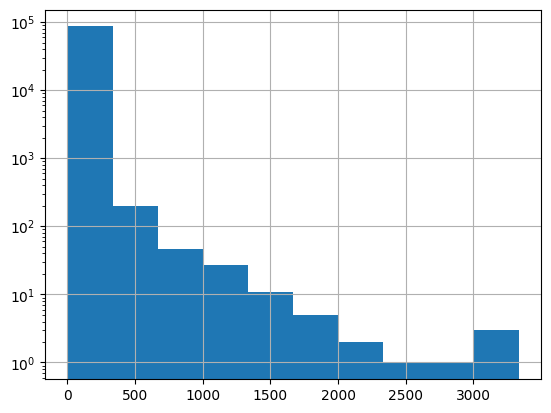

In [378]:
cumm_df['number_of_papers'].hist(log=True)

In [379]:
cumm_df.to_csv("cumm_df.csv", index=False)

In [72]:
cumm_df = pd.read_csv("cumm_df.csv")

In [76]:
frames = []

another_df = cumm_df.copy()
another_df['number_of_papers'] = another_df['number_of_papers'].clip(upper=500)
mn = another_df['number_of_papers'].min()
mx = another_df['number_of_papers'].max()
another_df['number_of_papers_scaled'] = ((another_df['number_of_papers']-mn)/(mx-mn))*300

for year, _df in another_df.groupby('Year'):
        
    def get_continent_plots(continent):
        __df = _df[_df['continent']==continent]
        
        if len(__df) == 0:
            return go.Scattergeo(name=continent, 
                                 lat=[0,0,None], 
                                 lon=[0,0,None], 
                                 mode="none",
                                )
        
        return go.Scattergeo(
                    name = continent,
                    lat=__df[["Latitude"]].values.ravel(),
                    lon=__df[["Longitude"]].values.ravel(),
                    mode="markers",
                    marker = dict(color=color_map[continent], size=__df["number_of_papers_scaled"],
                                 line=dict(width=1, color='black')),
                    hoverinfo = 'text',
                    hovertext = __df[["DisplayName"]].values.ravel()\
                                + "<br>Num of papers:"\
                                + __df[["number_of_papers"]].astype(int).astype(str).values.ravel()
                    #__df[["DisplayName"]].values.ravel(),
                ) 
        
    frames.append(
        go.Frame(
            name=int(year),
            data=[get_continent_plots(continent) for continent in color_map],
            traces = list(range(len(color_map)))) # number of continents
        )

# now create figure and add play button and slider
fig = go.Figure(
    data=frames[0].data,
    frames=frames,
    layout={
        "updatemenus": [
            {
                "type": "buttons",
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 500, "redraw": True},"fromcurrent": True, "transition": {"duration": 300, "easing": "quadratic-in-out"}}],
                        "label": "▶",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True},"mode": "immediate", "transition": {"duration": 0}}],
                        "label": "⏸",
                        "method": "animate"
                    }
                ],
            }
        ],
        "sliders": [
            {
                "active": 0,
                "steps": [
                    {
                        "label": f.name,
                        "method": "animate",
                        "args": [[f.name]],
                    }
                    for f in frames
                ],
            }
        ],
    },
)

fig.update_geos(
    visible=False, 
    resolution=50,
    showland=True, landcolor="rgb(245, 245, 245)",
    showcountries=True, countrycolor="rgb(161, 161, 161)",
    showocean=True, oceancolor="rgb(222, 247, 250)",
    showlakes=True, lakecolor="rgb(222, 247, 250)",
)

fig.update_layout(showlegend=False,
                  margin=dict(l=0, r=0, t=50, b=0, pad=0),
                  sliders=[{"pad":dict(t=10, r=10, l=10)}],
                  updatemenus=[dict(type='buttons',
                                  showactive=False,
                                  y= 0,
                                  x= 0,
                                  xanchor='left',
                                  yanchor='bottom')
                              ],
                  title = "UWarerloo cummulative collaboration over the years<br>"
                          "<span style=\"font-size:13px\">Hover for institution name and number of papers."
                          " Size of bubbles are scaled to [0,300].<span>",
                 )

fig.write_html('plot_uw_cumm_bub_scaled.html', auto_play = False)
# fig.show()

In [77]:
with open('index.html', 'a') as f:
    f.write(fig.to_html(auto_play = False, full_html=False, include_plotlyjs=False))